# TP1 - Panorámica

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

INPUTS = Path("inputs")
OUTPUTS = Path("outputs")
OUTPUTS.mkdir(exist_ok=True)

ESCALA = 0.5

def cargar(nombre, escala=ESCALA):
    img = cv2.imread(str(INPUTS / nombre))
    if img is None:
        raise FileNotFoundError(f"No encontré {nombre}")
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    if escala != 1.0:
        img = cv2.resize(img, None, fx=escala, fy=escala,
                         interpolation=cv2.INTER_AREA)
    return img

def mostrar(imgs, titulos=None, figsize=(16, 6)):
    if not isinstance(imgs, (list, tuple)):
        imgs = [imgs]
    fig, axes = plt.subplots(1, len(imgs), figsize=figsize)
    if len(imgs) == 1:
        axes = [axes]
    for ax, img in zip(axes, imgs):
        ax.imshow(img, cmap="gray" if img.ndim == 2 else None)
        ax.axis("off")
    if titulos:
        for ax, t in zip(axes, titulos):
            ax.set_title(t)
    plt.tight_layout()
    plt.show()

print("ok")

ok


## Cargar imágenes

Escala 0.5, las originales son enormes.
OpenCV abre en BGR → convertir a RGB.
La del medio es la ancla.

cuadro [(2048, 1536, 3), (2048, 1536, 3), (2048, 1536, 3)]
udesa [(1500, 1500, 3), (1500, 1500, 3), (1500, 1500, 3)]


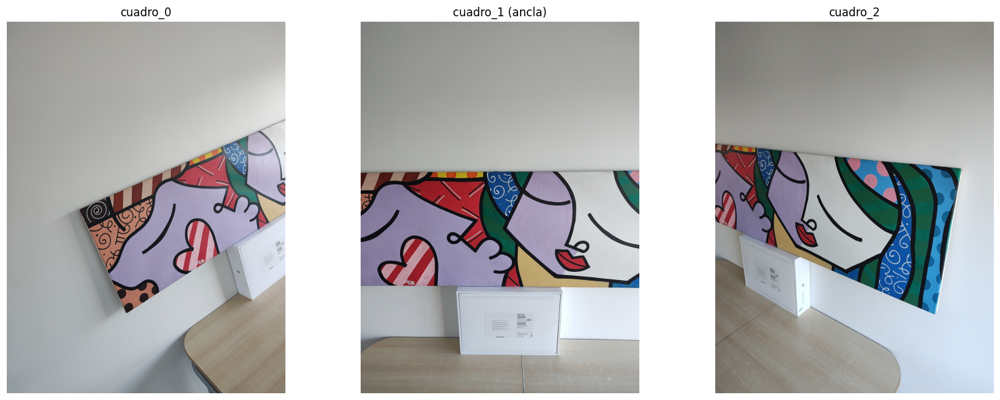

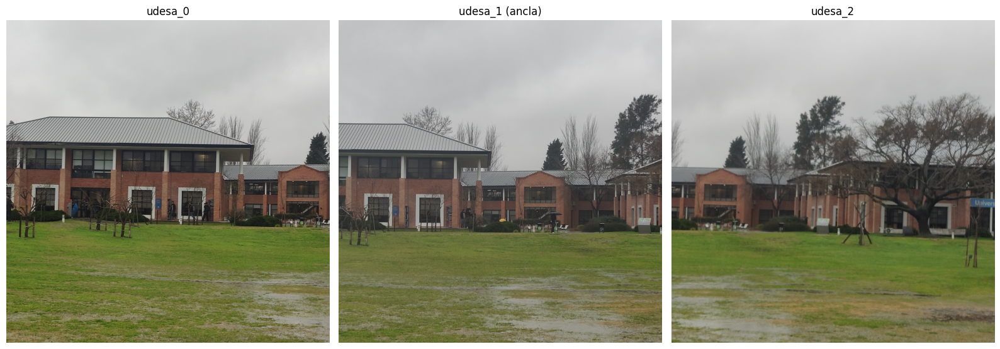

In [3]:
cuadro = [cargar(f"cuadro_{i}.jpg") for i in range(3)]
udesa  = [cargar(f"udesa_{i}.jpg")  for i in range(3)]

for nombre, imgs in [("cuadro", cuadro), ("udesa", udesa)]:
    print(nombre, [im.shape for im in imgs])

mostrar(cuadro, ["cuadro_0", "cuadro_1 (ancla)", "cuadro_2"])
mostrar(udesa,  ["udesa_0",  "udesa_1 (ancla)",  "udesa_2"])

In [4]:
ds = cuadro
NOMBRE_DS = "cuadro"


## 1. Detectar features

SIFT: aguanta escala y rotación, que es lo que cambia entre tomas.

1529 (1529, 128)
1659 (1659, 128)
1515 (1515, 128)


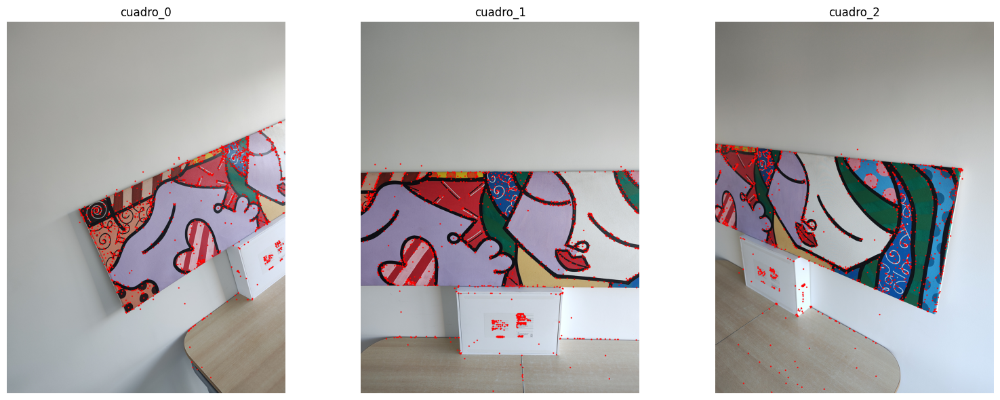

In [5]:
sift = cv2.SIFT_create()

def detectar(img):
    gris = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    return sift.detectAndCompute(gris, None)

def dibujar_kps(img, kps, color=(255, 0, 0)):
    out = img.copy()
    for k in kps:
        cv2.circle(out, (int(k.pt[0]), int(k.pt[1])), 4, color, -1)
    return out

kps_ds, desc_ds = [], []
for im in ds:
    k, d = detectar(im)
    kps_ds.append(k); desc_ds.append(d)
    print(len(k), d.shape)

mostrar([dibujar_kps(im, k) for im, k in zip(ds, kps_ds)],
        [f"{NOMBRE_DS}_{i}" for i in range(3)])

## 2. ANMS

Los keypoints quedan amontonados donde hay textura → homografía mala en el resto de la imagen.

A cada uno le calculamos el radio hasta el vecino más cercano con mejor respuesta. Radio grande = manda en su zona. Ordenamos por radio → nos quedamos con los primeros N → quedan repartidos.

Antes deduplicamos: SIFT repite la misma posición cuando detecta varias orientaciones (~19% de los puntos) y eso rompe el ranking, todos los clones quedan con radio 0.

El pseudocódigo del enunciado tiene el `if SD < Ri` fuera del `if rj > ri`, así que ignora la respuesta. Lo anidamos como el paper de Brown.

500 (500, 128)
500 (500, 128)
500 (500, 128)


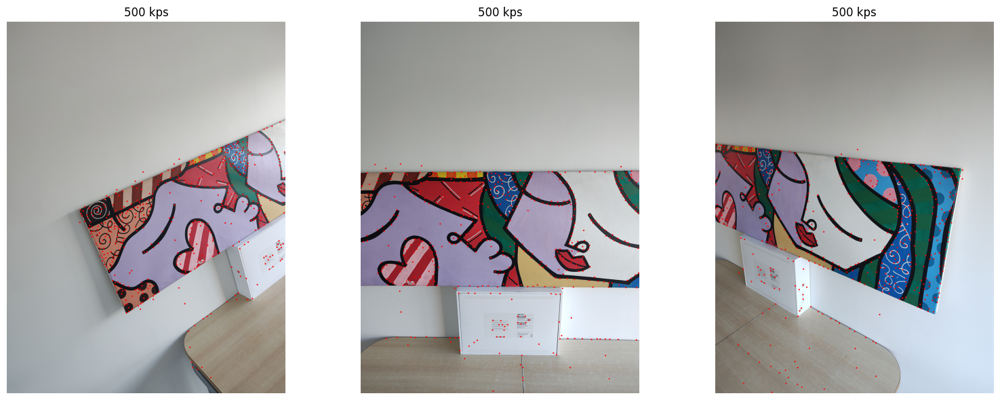

In [6]:
def anms(kps, desc, N=500):
    resp = np.array([k.response for k in kps])
    pts  = np.array([k.pt for k in kps])

    # ordenamos por respuesta descendente
    orden = np.argsort(-resp)
    pts, resp = pts[orden], resp[orden]
    kps  = [kps[i] for i in orden]
    desc = desc[orden]

    # dedup: como ya está ordenado, el primero de cada posición es el mejor
    _, idx = np.unique(pts, axis=0, return_index=True)
    idx = np.sort(idx)
    pts = pts[idx]
    kps  = [kps[i] for i in idx]
    desc = desc[idx]

    # radio = distancia al punto más cercano con mejor respuesta
    radios = np.full(len(kps), np.inf)
    for i in range(1, len(kps)):
        radios[i] = np.sum((pts[:i] - pts[i])**2, axis=1).min()

    mejores = np.argsort(-radios)[:N]
    return [kps[i] for i in mejores], desc[mejores]


N_KP = 500
kps_anms, desc_anms = [], []
for k, d in zip(kps_ds, desc_ds):
    ka, da = anms(k, d, N_KP)
    kps_anms.append(ka); desc_anms.append(da)
    print(len(ka), da.shape)

mostrar([dibujar_kps(im, k) for im, k in zip(ds, kps_anms)],
        [f"{len(k)} kps" for k in kps_anms])

Pasamos de ~1500 a 500 y dejaron de estar todos pegados a los contornos negros. Aparecieron puntos en el piso y el borde de la mesa, que antes no tenían ninguno.

Siguen concentrados en el cuadro porque la pared es lisa: el ANMS reparte lo que hay, no crea puntos donde SIFT no detectó nada.

## 3. Matching

Matcheamos cada imagen contra la ancla (la 1). Dos criterios:

- **cross-check**: A matchea con B y B con A. Lo hace OpenCV con `crossCheck=True`.
- **Lowe's ratio**: el mejor vecino tiene que estar bastante más cerca que el segundo. Si están parecidos, el punto es ambiguo (textura repetida) → lo tiramos.

SIFT es float → norma L2. Si usáramos ORB sería Hamming.

In [7]:
def match_crosscheck(d1, d2):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    return bf.match(d1, d2)

def match_lowe(d1, d2, ratio=0.75):
    bf = cv2.BFMatcher(cv2.NORM_L2)
    pares = bf.knnMatch(d1, d2, k=2)
    return [m for m, n in pares if m.distance < ratio * n.distance]

ANCLA = 1

for i in [0, 2]:
    cc = match_crosscheck(desc_anms[i], desc_anms[ANCLA])
    lo = match_lowe(desc_anms[i], desc_anms[ANCLA])
    print(f"img{i} vs ancla → crosscheck {len(cc)}, lowe {len(lo)}")

img0 vs ancla → crosscheck 149, lowe 73
img2 vs ancla → crosscheck 148, lowe 50


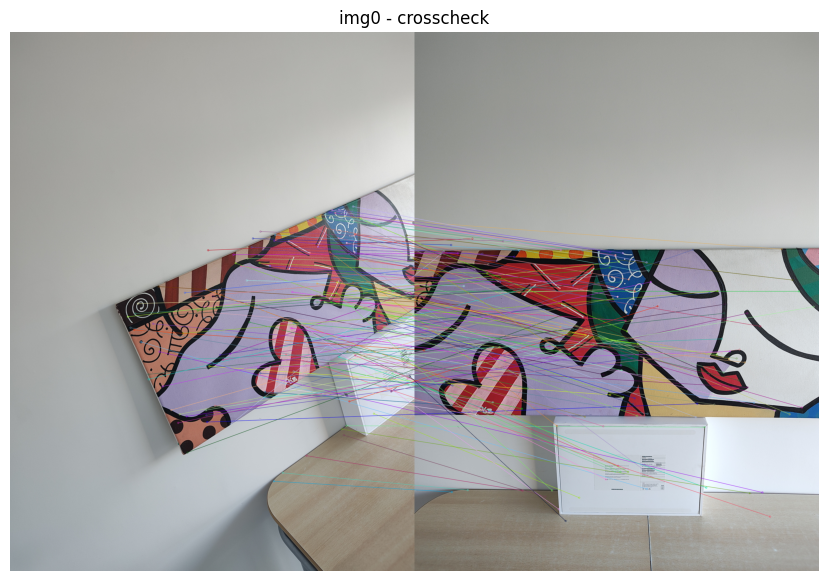

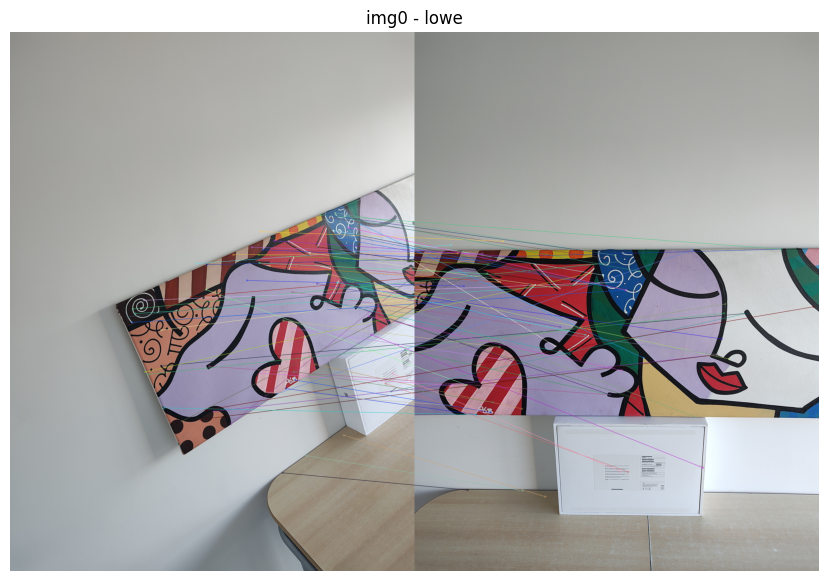

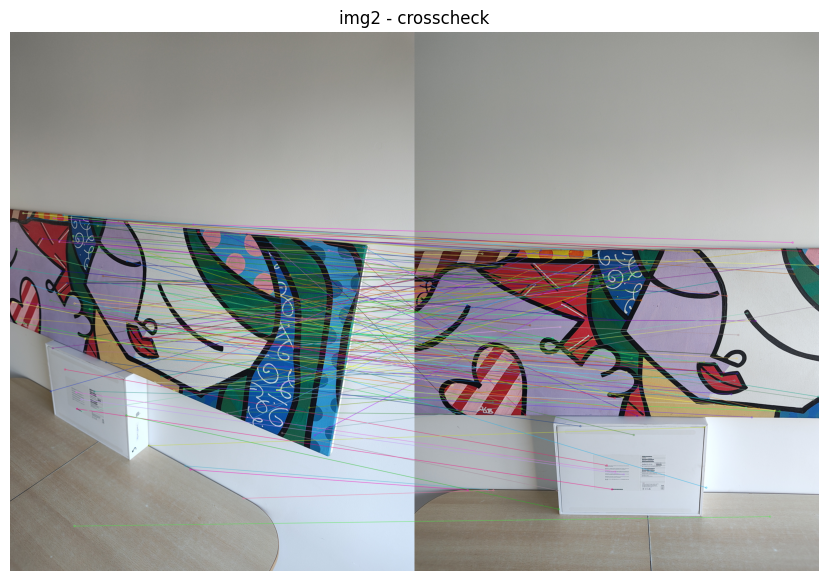

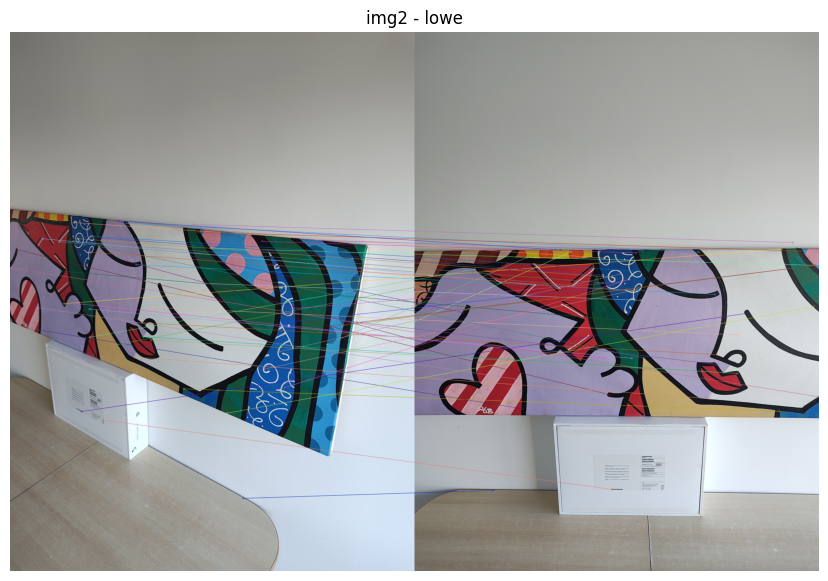

In [8]:
def dibujar_matches(i, matches, titulo):
    out = cv2.drawMatches(ds[i], kps_anms[i], ds[ANCLA], kps_anms[ANCLA],
                          matches, None,
                          flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
    plt.figure(figsize=(16, 7))
    plt.imshow(out); plt.axis("off"); plt.title(titulo)
    plt.show()

for i in [0, 2]:
    dibujar_matches(i, match_crosscheck(desc_anms[i], desc_anms[ANCLA]),
                    f"img{i} - crosscheck")
    dibujar_matches(i, match_lowe(desc_anms[i], desc_anms[ANCLA]),
                    f"img{i} - lowe")

img0 → 54 matches


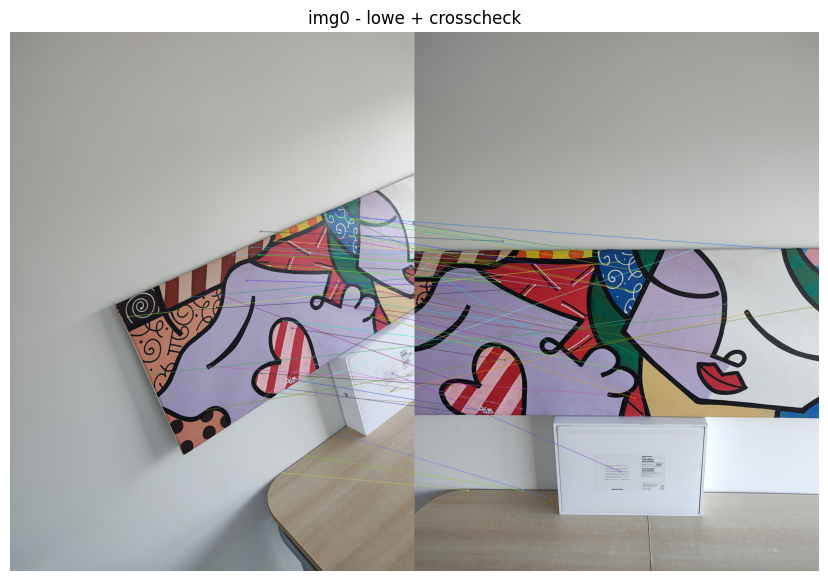

img2 → 44 matches


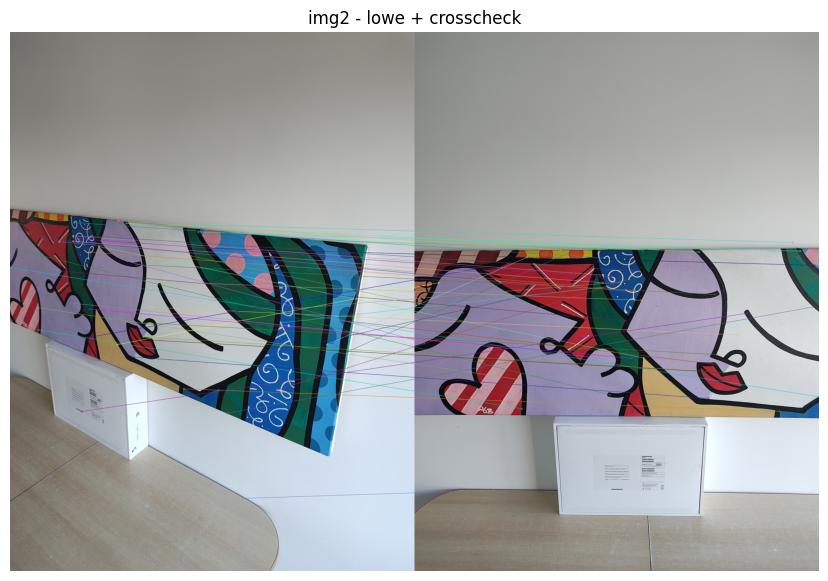

In [9]:
def match_combinado(d1, d2, ratio=0.75):
    lo = match_lowe(d1, d2, ratio)
    cc = {(m.queryIdx, m.trainIdx) for m in match_crosscheck(d1, d2)}
    return [m for m in lo if (m.queryIdx, m.trainIdx) in cc]

matches = {}
for i in [0, 2]:
    matches[i] = match_combinado(desc_anms[i], desc_anms[ANCLA])
    print(f"img{i} → {len(matches[i])} matches")
    dibujar_matches(i, matches[i], f"img{i} - lowe + crosscheck")

Crosscheck solo deja un desastre de líneas cruzadas. Lowe limpia bastante más pero igual quedan outliers, sobre todo en img2 (la caja y el piso, que se repiten).

Nos quedamos con los dos criterios juntos: pedimos que pase el ratio y además que sea mutuo. Los outliers que sobrevivan los saca RANSAC.

## 4. Homografía manual (DLT)

H tiene 8 grados de libertad (3x3 pero a menos de escala) → cada correspondencia da 2 ecuaciones → 4 puntos alcanzan.

Al elegirlos: bien separados y que no haya tres alineados. Si son colineales el sistema queda degenerado.

Usamos las dos versiones: `dlt` resuelve el sistema 8x8 con 4 puntos exactos (la usamos dentro de RANSAC), y `estimar_homografia_svd` acepta N puntos por cuadrados mínimos (la usamos al final con todos los inliers).

In [10]:
def dlt(ori, dst):
    """4 correspondencias exactas. Sistema 8x8."""
    A, b = [], []
    for i in range(4):
        x, y = ori[i]
        xp, yp = dst[i]
        A.append([-x, -y, -1, 0, 0, 0, x*xp, y*xp])
        A.append([0, 0, 0, -x, -y, -1, x*yp, y*yp])
        b += [xp, yp]

    H = -np.linalg.solve(np.array(A, float), np.array(b, float))
    return np.hstack([H, [1]]).reshape(3, 3)


def estimar_homografia_svd(ori, dst):
    """N correspondencias, cuadrados mínimos vía SVD."""
    A = []
    for (x, y), (xp, yp) in zip(ori, dst):
        A.append([-x, -y, -1, 0, 0, 0, x*xp, y*xp, xp])
        A.append([0, 0, 0, -x, -y, -1, x*yp, y*yp, yp])

    _, _, Vt = np.linalg.svd(np.array(A, float))
    H = Vt[-1].reshape(3, 3)
    return H / H[2, 2]

In [11]:
def homo(pts):
    return np.hstack([pts, np.ones((len(pts), 1))])

def transform(H, pts):
    """Aplica H a un array (N,2) y vuelve a cartesianas."""
    q = (H @ homo(np.asarray(pts, float)).T).T
    return q[:, :2] / q[:, 2:]

def points_from_matches(kp1, kp2, matches):
    pts1 = np.float32([kp1[m.queryIdx].pt for m in matches])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in matches])
    return pts1, pts2

def distancias_reproyeccion(H, pts1, pts2):
    return np.linalg.norm(transform(H, pts1) - pts2, axis=1)

def error_reproyeccion(H, pts1, pts2):
    return np.sqrt(np.mean(distancias_reproyeccion(H, pts1, pts2)**2))

def inliers_mask(H, pts1, pts2, thresh=5.0):
    return (distancias_reproyeccion(H, pts1, pts2) < thresh).astype(int)

In [12]:
%matplotlib inline

def picker_cv(img, titulo, n=4, escala=0.4):
    """Abre una ventana aparte, clickeás n puntos y se cierra sola. ESC cancela."""
    vista = cv2.resize(img, None, fx=escala, fy=escala)
    vista = cv2.cvtColor(vista, cv2.COLOR_RGB2BGR)
    pts = []

    def click(event, x, y, flags, param):
        if event != cv2.EVENT_LBUTTONDOWN or len(pts) >= n:
            return
        # macOS manda el click duplicado, lo descartamos
        if pts and abs(pts[-1][0]*escala - x) < 5 and abs(pts[-1][1]*escala - y) < 5:
            return
        pts.append((x / escala, y / escala))
        cv2.circle(vista, (x, y), 5, (0, 0, 255), -1)
        cv2.putText(vista, str(len(pts)), (x+8, y-8),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 0, 255), 2)

    cv2.namedWindow(titulo)
    cv2.setMouseCallback(titulo, click)
    while True:
        cv2.imshow(titulo, vista)
        if cv2.waitKey(20) == 27 or len(pts) >= n:
            break
    cv2.waitKey(500)
    cv2.destroyAllWindows()
    for _ in range(4):
        cv2.waitKey(1)
    return np.float32(pts)

In [13]:
# Puntos elegidos a mano 

p0 = np.float32([[1070.0, 1325.0],
                 [1312.5, 1045.0],
                 [ 922.5, 1332.5],
                 [1197.5,  732.5]])

p1a = np.float32([[ 270.0, 1442.5],
                  [ 712.5, 1307.5],
                  [ 105.0, 1357.5],
                  [ 682.5,  887.5]])

In [14]:
H_manual = dlt(p0, p1a)
print(H_manual.round(6))
print("error de reproyección en los 4 puntos:", error_reproyeccion(H_manual, p0, p1a))

[[ 7.68151000e-01 -2.70578000e-01 -2.66970944e+02]
 [ 4.61170000e-02  7.83261000e-01 -3.76988920e+01]
 [-3.02000000e-04  3.80000000e-05  1.00000000e+00]]
error de reproyección en los 4 puntos: 2.1457920056692358e-13


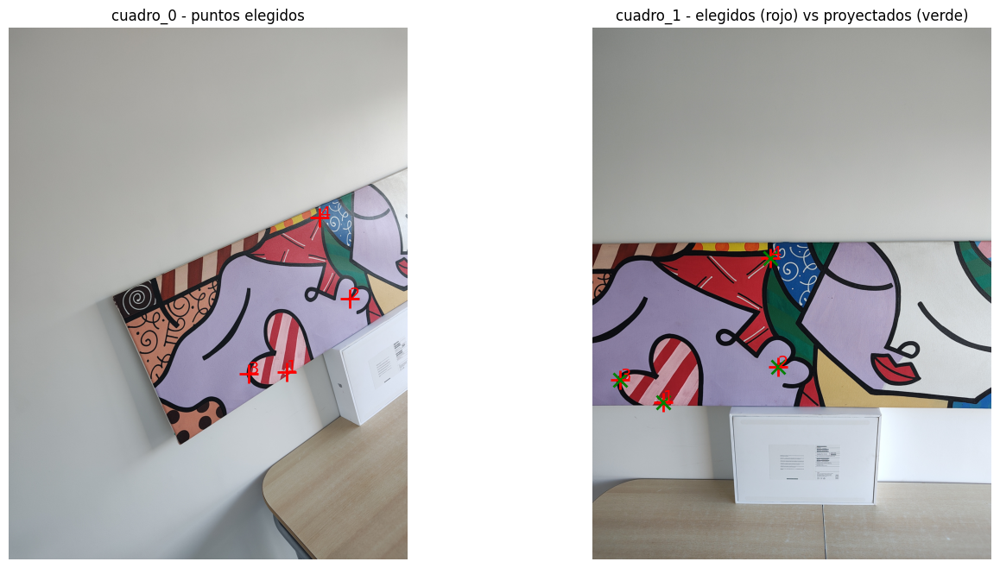

In [15]:
p0_proy = transform(H_manual, p0)

fig, axes = plt.subplots(1, 2, figsize=(16, 8))
axes[0].imshow(ds[0]); axes[0].set_title("cuadro_0 - puntos elegidos")
axes[1].imshow(ds[ANCLA]); axes[1].set_title("cuadro_1 - elegidos (rojo) vs proyectados (verde)")

for i, (x, y) in enumerate(p0, 1):
    axes[0].plot(x, y, "r+", ms=16, mew=2)
    axes[0].annotate(str(i), (x, y), color="red", fontsize=14)

for i, ((x, y), (xp, yp)) in enumerate(zip(p1a, p0_proy), 1):
    axes[1].plot(x, y, "r+", ms=16, mew=2)
    axes[1].plot(xp, yp, "gx", ms=12, mew=2)
    axes[1].annotate(str(i), (x, y), color="red", fontsize=14)

for ax in axes: ax.axis("off")
plt.show()

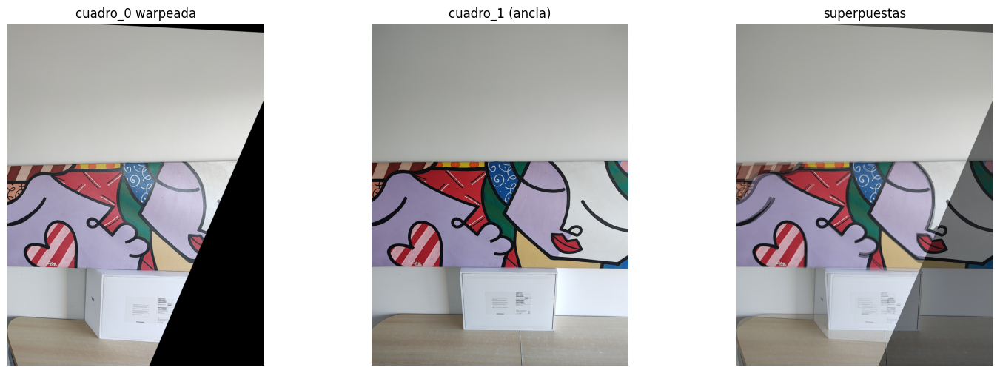

In [16]:
h, w = ds[ANCLA].shape[:2]
warp = cv2.warpPerspective(ds[0], H_manual, (w, h))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(warp);          axes[0].set_title("cuadro_0 warpeada")
axes[1].imshow(ds[ANCLA]);     axes[1].set_title("cuadro_1 (ancla)")
axes[2].imshow(cv2.addWeighted(warp, 0.5, ds[ANCLA], 0.5, 0))
axes[2].set_title("superpuestas")
for ax in axes: ax.axis("off")
plt.show()

Con 4 puntos el error de reproyección da ~1e-13, pero eso no dice nada: el sistema es exacto, siempre da 0 aunque los puntos estén mal elegidos. La prueba real es warpear: en la superposición las líneas del dibujo caen una sobre otra sin fantasma → la H es buena.

Qué tener en cuenta al elegir los pares: que se vean en ambas imágenes, que sean detalles únicos (nada de texturas repetidas como los rulos del fondo), que estén repartidos por la imagen y que no haya tres colineales, porque ahí el sistema queda degenerado.

El triángulo negro es la zona del canvas que la imagen warpeada no cubre. Se resuelve en 3.6.

In [17]:
# Puntos elegidos a mano 
p2 = np.float32([[335.0,  802.5],
                 [237.5,  992.5],
                 [445.0, 1110.0],
                 [672.5,  787.5]])

p1b = np.float32([[ 897.5,  940.0],
                  [ 707.5, 1192.5],
                  [1080.0, 1262.5],
                  [1410.0,  867.5]])

[[ 2.32838800e+00 -1.43525000e-01  2.92035646e+02]
 [ 2.59879000e-01  1.09140100e+00  3.92694420e+01]
 [ 5.02000000e-04 -1.27000000e-04  1.00000000e+00]]
error: 3.855308240830066e-13


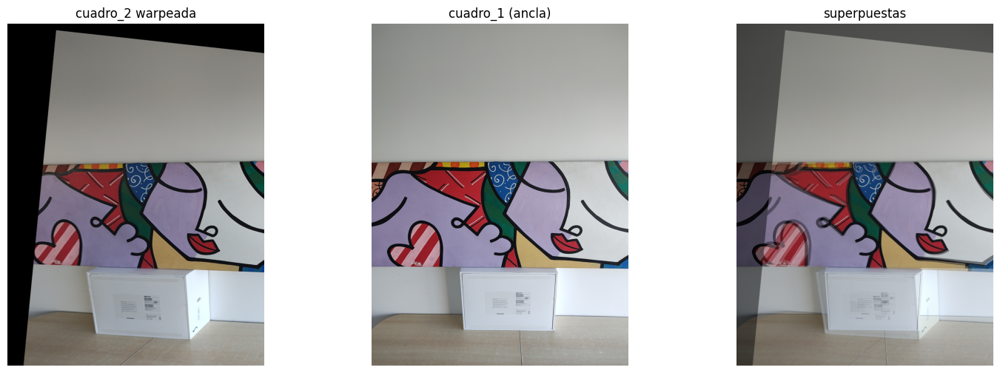

In [18]:
H_manual_2 = dlt(p2, p1b)
print(H_manual_2.round(6))
print("error:", error_reproyeccion(H_manual_2, p2, p1b))

warp2 = cv2.warpPerspective(ds[2], H_manual_2, (w, h))

fig, axes = plt.subplots(1, 3, figsize=(18, 6))
axes[0].imshow(warp2);      axes[0].set_title("cuadro_2 warpeada")
axes[1].imshow(ds[ANCLA]);  axes[1].set_title("cuadro_1 (ancla)")
axes[2].imshow(cv2.addWeighted(warp2, 0.5, ds[ANCLA], 0.5, 0))
axes[2].set_title("superpuestas")
for ax in axes: ax.axis("off")
plt.show()

### Sobre las hipótesis del modelo

Una homografía relaciona dos vistas solo si se cumple una de dos: o la escena es plana, o la cámara solo rota sin trasladarse. Si no, aparece paralaje y no existe una única H que alinee todo.

En el dataset cuadro se ve clarito. Alineando con puntos sobre el cuadro (que está contra la pared) el cuadro encaja perfecto, pero la caja blanca queda doble: está apoyada en la mesa, adelante del plano de la pared, y como el fotógrafo se movió entre tomas se desplaza distinto.

Es un problema del modelo, no del método: no hay 4 puntos que arreglen las dos profundidades a la vez. Al elegir sobre qué plano alinear, elegimos qué parte de la imagen va a quedar bien.

## 5. RANSAC

DLT con 4 puntos anda si los 4 son correctos. Con los matches automáticos tenemos ~50 pares y algunos son basura → un solo outlier arruina la estimación.

RANSAC: sampleamos 4 al azar, calculamos H, contamos cuántos matches son consistentes (inliers). Repetimos T veces y nos quedamos con el mejor consenso. Al final recalculamos H por cuadrados mínimos con todos los inliers.

In [19]:
def ransac_homografia(pts1, pts2, T=2000, thresh=5.0, seed=0):
    rng = np.random.default_rng(seed)
    n = len(pts1)
    mejor_inliers = np.zeros(n, dtype=bool)

    for _ in range(T):
        idx = rng.choice(n, 4, replace=False)
        try:
            H = dlt(pts1[idx], pts2[idx])
        except np.linalg.LinAlgError:
            continue          # los 4 salieron degenerados
        if not np.isfinite(H).all():
            continue

        d = distancias_reproyeccion(H, pts1, pts2)
        inliers = d < thresh
        if inliers.sum() > mejor_inliers.sum():
            mejor_inliers = inliers

    # H final con TODOS los inliers, por cuadrados mínimos
    H = estimar_homografia_svd(pts1[mejor_inliers], pts2[mejor_inliers])
    return H, mejor_inliers

In [20]:
Hs = {}
for i in [0, 2]:
    pts1, pts2 = points_from_matches(kps_anms[i], kps_anms[ANCLA], matches[i])
    H, inl = ransac_homografia(pts1, pts2)
    Hs[i] = H
    print(f"img{i}: {inl.sum()}/{len(inl)} inliers | "
          f"error {error_reproyeccion(H, pts1[inl], pts2[inl]):.3f} px")

img0: 22/54 inliers | error 2.268 px
img2: 14/44 inliers | error 2.108 px


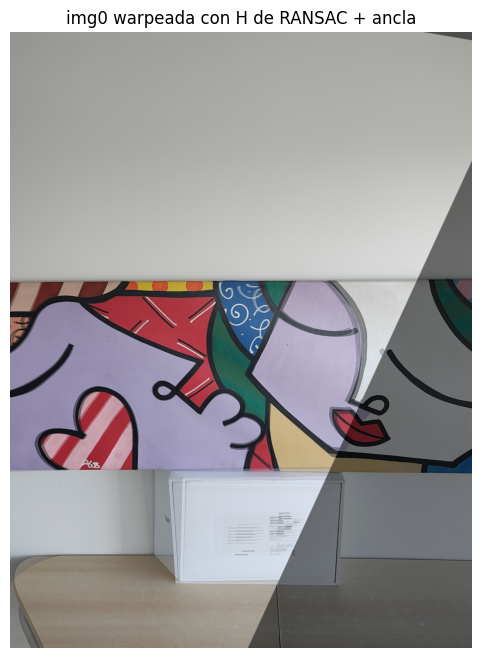

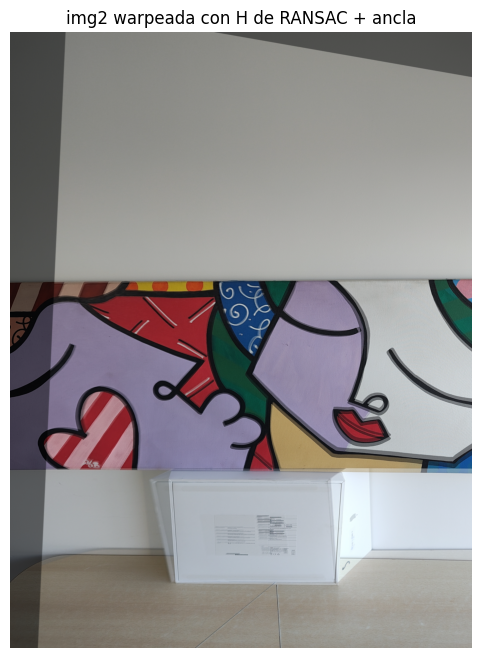

In [21]:
for i in [0, 2]:
    warp = cv2.warpPerspective(ds[i], Hs[i], (w, h))
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.addWeighted(warp, 0.5, ds[ANCLA], 0.5, 0))
    plt.title(f"img{i} warpeada con H de RANSAC + ancla"); plt.axis("off")
    plt.show()

In [22]:
for th in [3, 5, 8, 12]:
    for i in [0, 2]:
        pts1, pts2 = points_from_matches(kps_anms[i], kps_anms[ANCLA], matches[i])
        H, inl = ransac_homografia(pts1, pts2, thresh=th)
        print(f"th={th:2d} img{i}: {inl.sum():3d}/{len(inl)} | "
              f"err {error_reproyeccion(H, pts1[inl], pts2[inl]):.2f}")

th= 3 img0:  16/54 | err 1.38
th= 3 img2:  11/44 | err 1.59
th= 5 img0:  22/54 | err 2.27
th= 5 img2:  14/44 | err 2.11
th= 8 img0:  28/54 | err 3.13
th= 8 img2:  18/44 | err 4.87
th=12 img0:  31/54 | err 4.77
th=12 img2:  21/44 | err 4.40


Nos quedamos con th=5. Con 3 el error baja pero perdés la mitad de los puntos; con 8 el error de img2 se duplica → entran matches malos.

Los inliers dan bajos (41% y 32%) pero tiene sentido: los matches sobre la caja nunca van a ser inliers del plano del cuadro. RANSAC se queda con el plano de más consenso.

## 6. Canvas óptimo

Si se warpea con el tamaño de la ancla, las imágenes de los costados se cortan. Y si se agranda mucho, te quedan bordes negros

Lo que decidimos hacer: transformar las 4 esquinas de cada imagen por su H y sacar el mínimo y máximo de todos esos puntos juntos. Eso da el bounding box exacto de la panorámica

Como el mínimo suele ser negativo (parte de las imágenes cae a la izquierda o arriba del origen), le sumamos una traslación T a todas las H para correr todo a coordenadas positivas. La ancla también se warpea, con identidad, así le toca la misma T


In [23]:
def esquinas(img):
    h, w = img.shape[:2]
    return np.float32([[0, 0], [w, 0], [w, h], [0, h]])

def canvas_optimo(imgs, homografias):
    """homografias: H de cada imagen hacia el marco de la ancla (la ancla lleva identidad)"""
    todas = np.vstack([transform(H, esquinas(im))
                       for im, H in zip(imgs, homografias)])

    min_x, min_y = np.floor(todas.min(axis=0)).astype(int)
    max_x, max_y = np.ceil(todas.max(axis=0)).astype(int)

    T = np.array([[1, 0, -min_x],
                  [0, 1, -min_y],
                  [0, 0, 1]], dtype=float)

    size = (max_x - min_x, max_y - min_y)   # (ancho, alto), como lo pide warpPerspective
    return T, size


Hs_todas = [Hs[0], np.eye(3), Hs[2]]
T, size = canvas_optimo(ds, Hs_todas)

print("traslación:\n", T)
print("tamaño final:", size)

traslación:
 [[  1.   0. 925.]
 [  0.   1. 323.]
 [  0.   0.   1.]]
tamaño final: (3137, 3243)


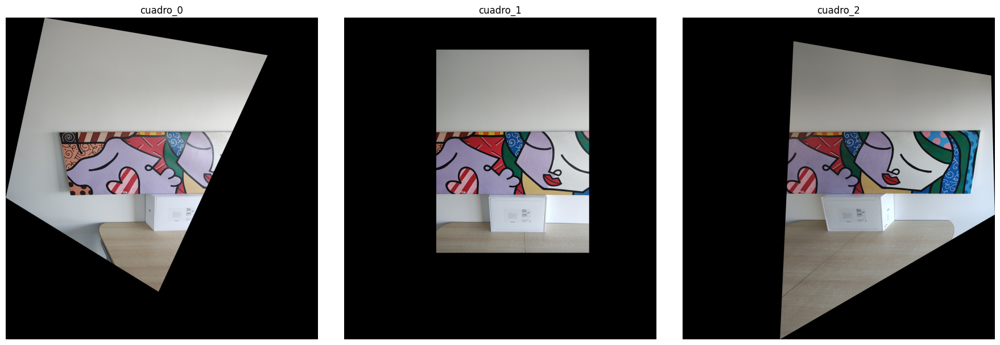

In [24]:
Hs_final = [T @ H for H in Hs_todas]
warps = [cv2.warpPerspective(im, H, size) for im, H in zip(ds, Hs_final)]

mostrar(warps, [f"{NOMBRE_DS}_{i}" for i in range(3)], figsize=(18, 6))

## 7. Stitching y blending

Primero pegamos a lo bruto: cada imagen pisa a la anterior donde no hay negro. Sirve para ver dónde queda la costura.

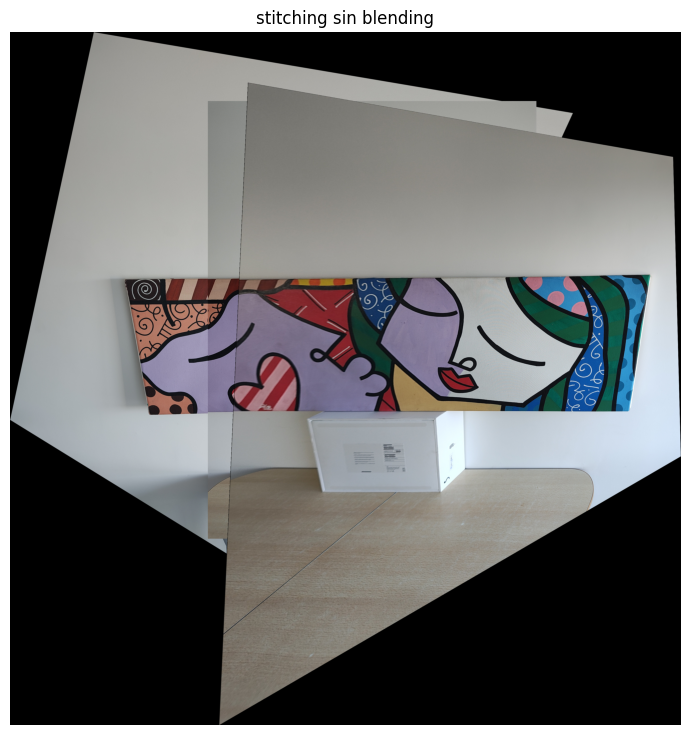

In [25]:
def pegar_crudo(warps):
    out = np.zeros_like(warps[0])
    for w_ in warps:
        mask = w_.any(axis=2)
        out[mask] = w_[mask]
    return out

crudo = pegar_crudo(warps)

plt.figure(figsize=(16, 9))
plt.imshow(crudo); plt.axis("off")
plt.title("stitching sin blending")
plt.show()

Se ve la panorámica completa pero con dos problemas: las costuras rectas en la pared (cada foto tiene distinta exposición) y la caja blanca que aparece cortada, otra vez por el paralaje

El blending arregla lo primero: en vez de pisar, promediamos con pesos. A cada imagen le armamos una máscara que vale mucho en el centro y se va a cero en los bordes (distanceTransform), y combinamos con el promedio ponderado del enunciado

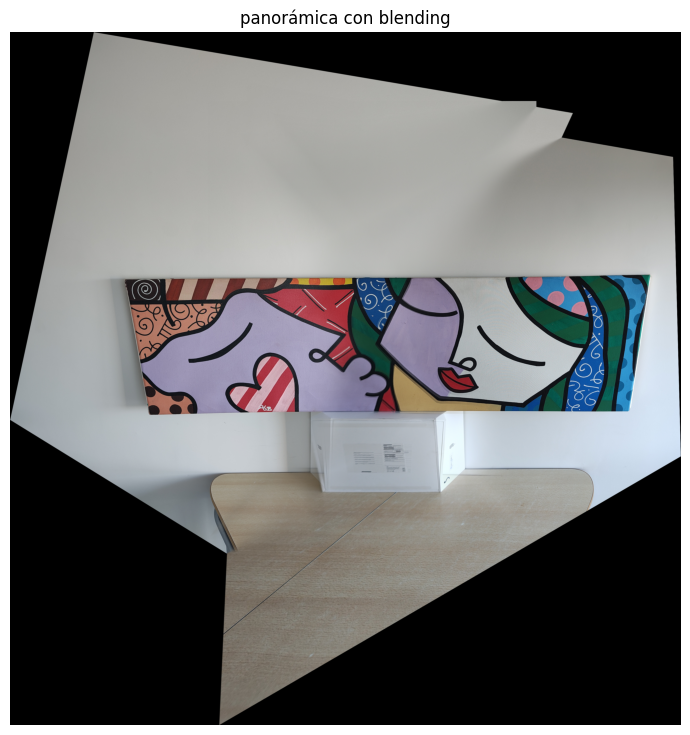

True

In [26]:
# def mascara_peso(warp):
#     """Peso alto en el centro de la zona válida, cae a cero en el borde."""
#     valido = (warp.any(axis=2)).astype(np.uint8)
#     # el borde del canvas cuenta como borde de la región
#     valido = cv2.copyMakeBorder(valido, 1, 1, 1, 1, cv2.BORDER_CONSTANT, value=0)
#     dist = cv2.distanceTransform(valido, cv2.DIST_L2, 5)[1:-1, 1:-1]
#     return dist / (dist.max() + 1e-8)
def mascara_peso(warp, gamma=6.0):
    valido = (warp.any(axis=2)).astype(np.uint8)
    valido = cv2.copyMakeBorder(valido, 1, 1, 1, 1, cv2.BORDER_CONSTANT, value=0)
    dist = cv2.distanceTransform(valido, cv2.DIST_L2, 5)[1:-1, 1:-1]
    W = dist / (dist.max() + 1e-8)
    return W ** gamma

def blending(warps):
    acum = np.zeros(warps[0].shape, dtype=np.float64)
    pesos = np.zeros(warps[0].shape[:2], dtype=np.float64)

    for w_ in warps:
        W = mascara_peso(w_)
        acum += w_.astype(np.float64) * W[:, :, None]
        pesos += W

    pesos[pesos == 0] = 1e-8
    return np.clip(acum / pesos[:, :, None], 0, 255).astype(np.uint8)


pano = blending(warps)

plt.figure(figsize=(16, 9))
plt.imshow(pano); plt.axis("off")
plt.title("panorámica con blending")
plt.show()

cv2.imwrite(str(OUTPUTS / f"{NOMBRE_DS}_pano.jpg"),
            cv2.cvtColor(pano, cv2.COLOR_RGB2BGR),
            [cv2.IMWRITE_JPEG_QUALITY, 92])

Las costuras de la pared desaparecieron: la transición entre fotos ahora es gradual en vez de un salto

Lo que el blending no arregla es la caja, que queda medio transparente. Tiene sentido: promediar dos versiones desalineadas no las alinea, las promedia. El fantasma es consecuencia del paralaje, no de cómo mezclamos

# Resultado sobre UdeSA

udesa_0: 51/65 inliers, err 1.33 px
udesa_2: 12/19 inliers, err 1.38 px


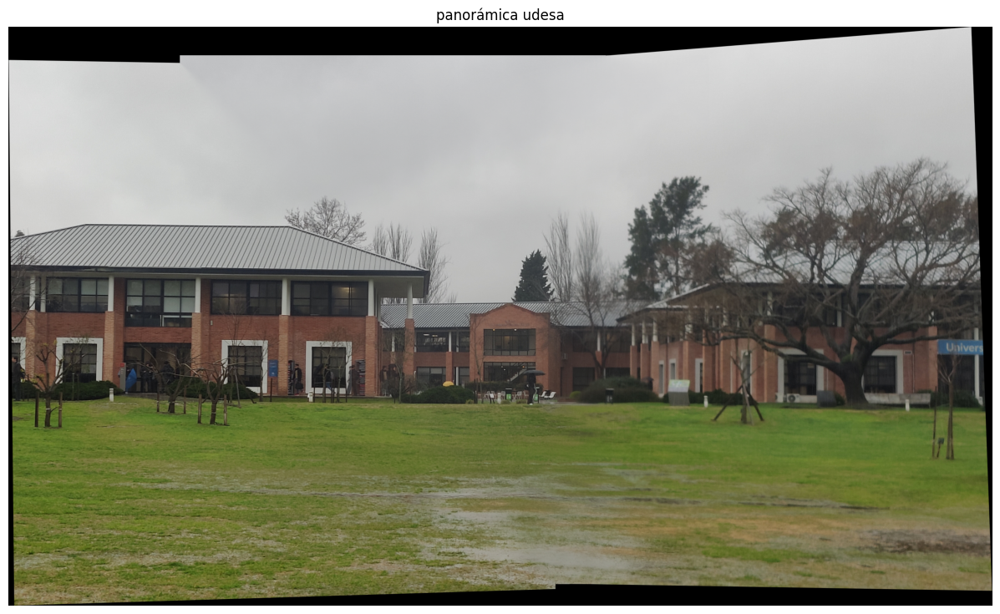

In [27]:
def pipeline(imgs, nombre, ancla=1, N=500, thresh=5.0):
    kps, desc = [], []
    for im in imgs:
        k, d = detectar(im)
        ka, da = anms(k, d, N)
        kps.append(ka); desc.append(da)

    Hs_ = []
    for i in range(3):
        if i == ancla:
            Hs_.append(np.eye(3)); continue
        m = match_combinado(desc[i], desc[ancla])
        p1, p2_ = points_from_matches(kps[i], kps[ancla], m)
        H, inl = ransac_homografia(p1, p2_, thresh=thresh)
        print(f"{nombre}_{i}: {inl.sum()}/{len(inl)} inliers, "
              f"err {error_reproyeccion(H, p1[inl], p2_[inl]):.2f} px")
        Hs_.append(H)

    T_, size_ = canvas_optimo(imgs, Hs_)
    warps_ = [cv2.warpPerspective(im, T_ @ H, size_) for im, H in zip(imgs, Hs_)]
    return blending(warps_)


pano_udesa = blending_udesa = pipeline(udesa, "udesa")

plt.figure(figsize=(16, 9))
plt.imshow(pano_udesa); plt.axis("off"); plt.title("panorámica udesa")
plt.show()

# Resultado con imágenes propias

udesa_nuestra_0: 101/104 inliers, err 1.44 px
udesa_nuestra_2: 67/69 inliers, err 2.20 px


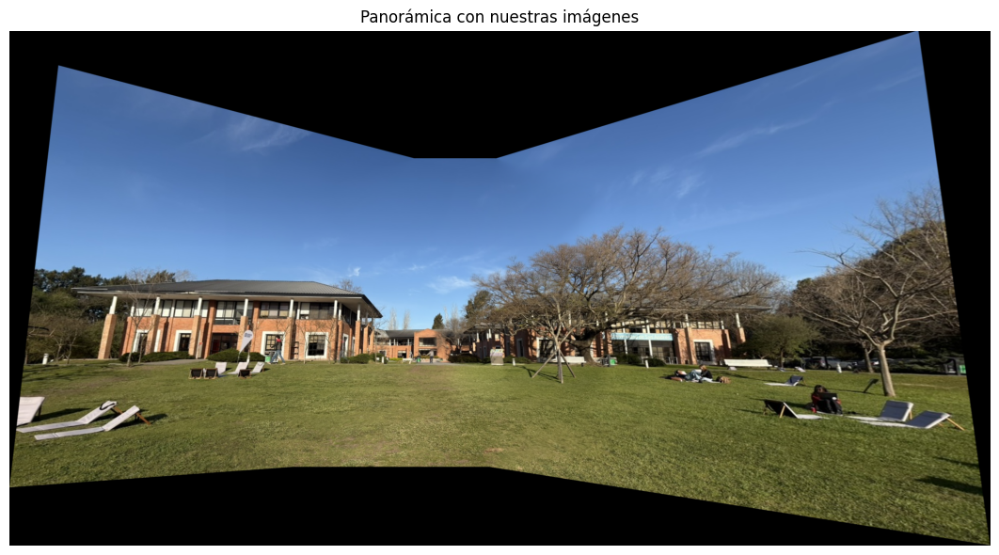

True

In [28]:
udesa_nuestra = [
    cargar(f"udesa_nuestra_{i}.jpg", escala=1.0)
    for i in range(3)
]

pano_nuestra = pipeline(
    udesa_nuestra,
    "udesa_nuestra",
    ancla=1,
    N=500,
    thresh=5.0
)

mostrar(pano_nuestra, ["Panorámica con nuestras imágenes"])

cv2.imwrite(
    str(OUTPUTS / "udesa_nuestra_pano.jpg"),
    cv2.cvtColor(pano_nuestra, cv2.COLOR_RGB2BGR)
)

#### Resultado con imágenes propias

Los resultados obtenidos fueron:

- `udesa_nuestra_0`: 101/104 inliers, con un error de reproyección de 1.44 px.
- `udesa_nuestra_2`: 67/69 inliers, con un error de reproyección de 2.20 px.

En ambos casos, aproximadamente el 97 % de las correspondencias fueron clasificadas como inliers. Esto indica que el matching fue consistente y que las homografías estimadas mediante RANSAC representan adecuadamente la transformación predominante entre las imágenes.

El canvas final se calculó utilizando las coordenadas de las esquinas de las tres imágenes luego de aplicar sus respectivas homografías. Las regiones negras aparecen porque el canvas es rectangular, mientras que las imágenes transformadas ocupan regiones irregulares dentro de él.

Aunque las fotografías fueron tomadas girando sobre nuestro propio eje, esto no garantiza una rotación exacta alrededor del centro óptico de la cámara. Al sostener el celular y girar el cuerpo, la cámara también puede experimentar pequeñas traslaciones, además de cambios de inclinación.

Por otra parte, los árboles, las personas y los edificios se encuentran a distintas profundidades. Por este motivo, la escena no es completamente plana y una única homografía no puede alinear perfectamente todos sus elementos. Estas condiciones pueden producir pequeñas deformaciones, paralaje o *ghosting* en las zonas de superposición.

Tamaño original: (1283, 2444, 3)
Tamaño recortado: (719, 2151, 3)


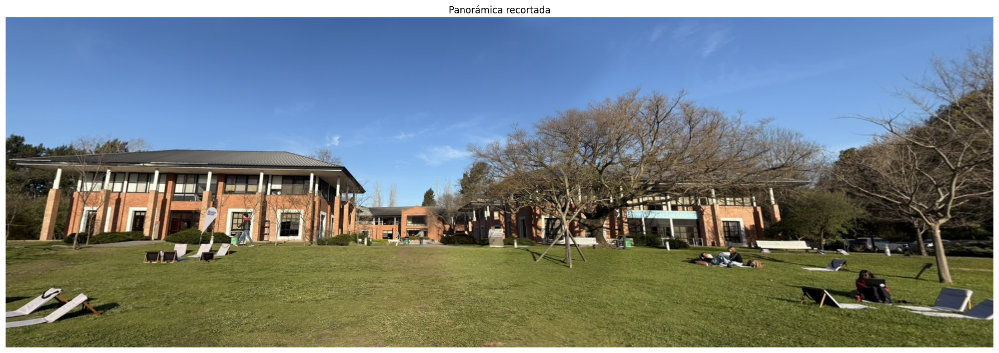

True

In [32]:
h, w = pano_nuestra.shape[:2]

# Recorte pensado para esta panorámica
x0 = int(0.06 * w)
x1 = int(0.94 * w)
y0 = int(0.26 * h)
y1 = int(0.82 * h)

pano_nuestra_recortada = pano_nuestra[y0:y1, x0:x1]

print("Tamaño original:", pano_nuestra.shape)
print("Tamaño recortado:", pano_nuestra_recortada.shape)

mostrar(
    pano_nuestra_recortada,
    ["Panorámica recortada"],
    figsize=(18, 7)
)

cv2.imwrite(
    str(OUTPUTS / "udesa_nuestra_pano_recortada.jpg"),
    cv2.cvtColor(pano_nuestra_recortada, cv2.COLOR_RGB2BGR),
    [cv2.IMWRITE_JPEG_QUALITY, 92]
)